# seismic data in Python

I have tested two ways to work with SEG-Y data:

* [ObsPy](https://github.com/obspy/obspy/wiki): big, very complete and very complex;
* [Segpy](https://github.com/rob-smallshire/segpy/), a fork of an old library called [SegyPy](http://segymat.sourceforge.net/segypy/) (note the additional *y*); smaller & simpler. This is the library I will be using and demonstrating here.

### loading SEG-Ys  with ObsPy

Let's load a SEG-Y first. I will use 2D lines taken from the [USGS Alaska land dataset](http://energy.usgs.gov/GeochemistryGeophysics/SeismicDataProcessingInterpretation/NPRASeismicDataArchive.aspx).

In [63]:
import numpy as np
import segypy
import matplotlib.pyplot as plt

%matplotlib inline
# comment out the following if you're not on a Mac with HiDPI display
%config InlineBackend.figure_format = 'retina'

In [64]:
filename='16_81_PT1_PR.SGY'

f=open(filename, 'rb')
line,header,trace_headers=segypy.read_segy(f)

To get some information about the data we interrogate the binary header in this way:

In [65]:
clip=abs(np.percentile(data, 0.999))

print 'number of traces: {0}, samples: {1}, sample rate: {2}'.format(header['ntraces'], header['ns'], header['dt'])
print 'trace length (ms): {0}'.format(header['dt']/1e3 * header['ns'])
print 'value to clip data display: {:.1f}'.format(clip)
print 'size in Kb of imported seismic: {0}'.format(data.nbytes/1024)

number of traces: 1912, samples: 1501, sample rate: 4000
trace length (ms): 6004.0
value to clip data display: 1667.9
size in Kb of imported seismic: 22421


To access the individual trace headers first pull out the elements stored in the header:

In [68]:
print 'The trace header has {0} elements:'.format(len(trace_headers.keys()))
for i in trace_headers.keys():
    print i

The trace header has 92 elements:
Inline3D
ShotPoint
HighCutSlope
OverTravel
cdp
SourceWaterDepth
GapSize
SourceUpholeTime
SourceStaticCorrection
GroupStaticCorrection
UnassignedInt2
UnassignedInt1
TransductionConstantMantissa
TraceValueMeasurementUnit
SourceDatumElevation
GroupWaterDepth
SweepLength
SourceEnergyDirectionExponent
DayOfYear
cdpY
cdpX
dt
LowCutFrequency
TraceNumber
TraceIdentifier
SourceGroupScalar
MinuteOfHour
MuteTimeStart
TraceSequenceFile
SubWeatheringVelocity
GeophoneGroupNumberRoll1
DataUse
filename
HighCutFrequency
SweepType
TaperType
Crossline3D
SecondOfMinute
MuteTimeEND
offset
cdpTrace
SourceType
ReceiverGroupElevation
SourceSurfaceElevation
FieldRecord
TransductionUnit
SweepFrequencyStart
YearDataRecorded
InstrumentInitialGain
TraceWeightingFactor
ShotPointScalar
InstrumentGainConstant
GroupY
GroupX
GroupUpholeTime
EnergySourcePoint
WeatheringVelocity
GainType
SourceMeasurementExponent
SweepTraceTaperLengthStart
SourceMeasurementMantissa
NStackedTraces
Correla

Then, to see the content of a particular trace header:

In [69]:
print trace_headers['cdp']

[   69.    70.    71. ...,  1978.  1979.  1980.]


Now let's plot the entire line:

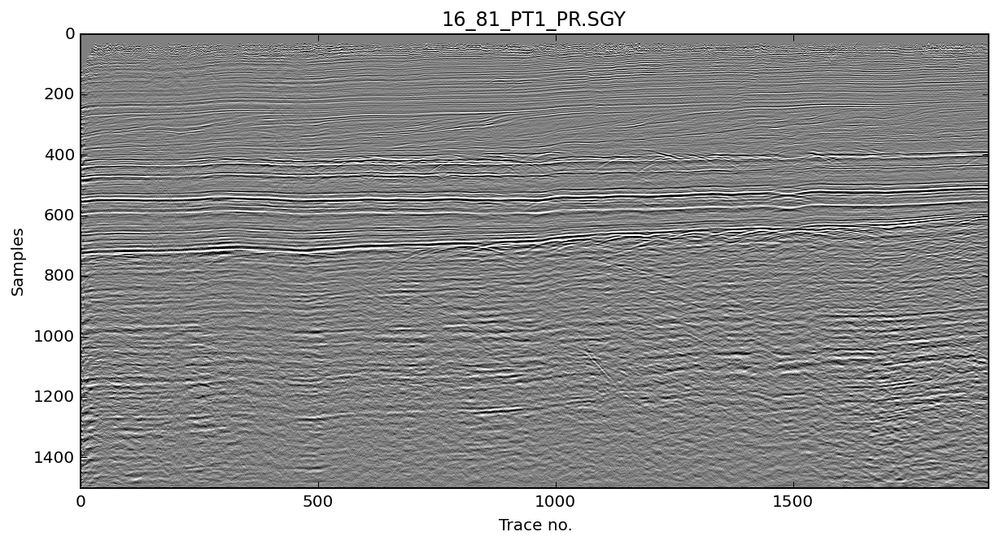

In [70]:
plt.figure(figsize=(10,5))
plt.imshow(data,interpolation='bilinear',aspect='auto',vmin=-clip,vmax=clip,cmap='gray')
plt.title('{0}'.format(filename))
plt.ylabel('Samples')
plt.xlabel('Trace no.')

## show the seismic

We can also define a simple function to plot the data:

In [71]:
def plot_seismic(inputseis,twt,name,colr=None,clip_val=None):
    ntraces=np.shape(inputseis)[1]
    if clip_val is None:
        clip_val=abs(np.percentile(inputseis, 0.999))   # default clip value
    if colr is None:
        colr='seismic'
    f, ax = plt.subplots(figsize=(16,6))
    im=ax.imshow(inputseis,interpolation='bilinear',aspect='auto',cmap=colr,extent=(0,ntraces,twt[-1],twt[0]),vmin=-clip_val,vmax=clip_val)
    plt.xlabel('Trace no.'), plt.ylabel('Two-way time [ms]')
    plt.title(name), plt.grid(), plt.colorbar(im)

First we create a two-way-time scale by reading the necessary information in the trace headers:

In [72]:
lagtime=trace_headers['LagTimeA'][0]*-1
twt=np.arange(lagtime,header['dt']/1e3*header['ns']+lagtime,header['dt']/1e3)

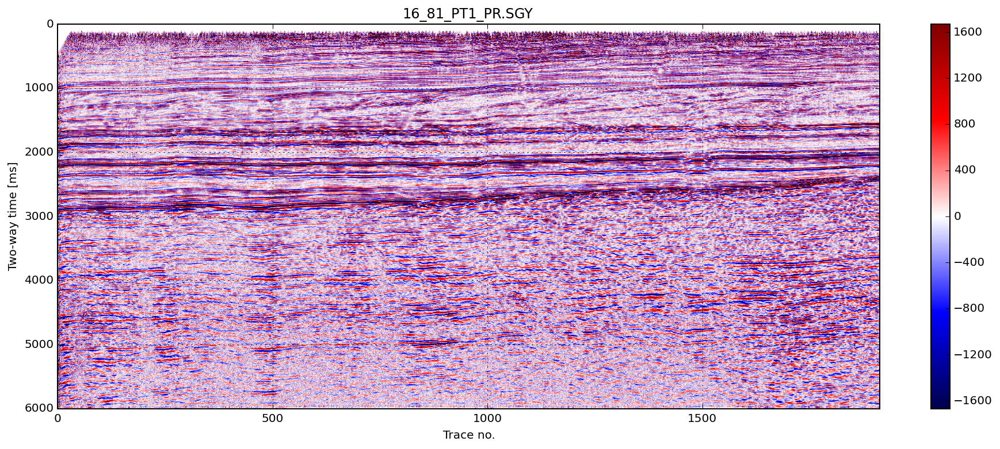

In [73]:
plot_seismic(line,twt,filename)

Another example, this time with a gray colorbar:

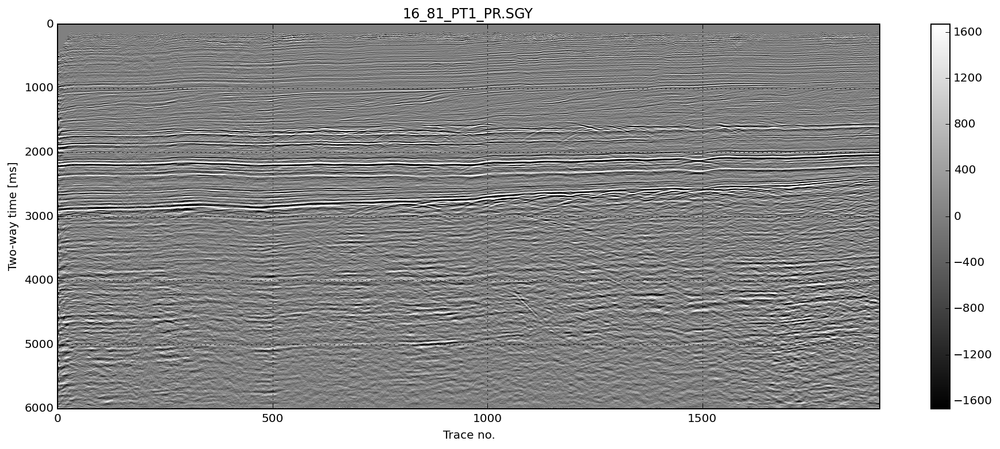

In [74]:
plot_seismic(line,twt,filename,colr='gray')

This is a way to zoom in, for example in the window from 1 to 2 seconds:

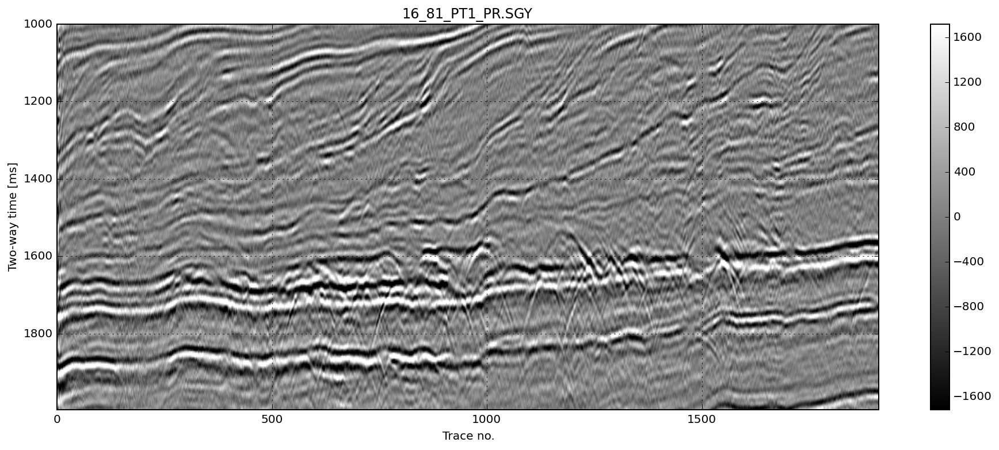

In [76]:
uu=1000; ll=2000

line_zoom=line[twt.tolist().index(uu):twt.tolist().index(ll),:]
twt_zoom=twt[twt.tolist().index(uu):twt.tolist().index(ll)]
plot_seismic(line_zoom,twt_zoom,filename,colr='gray')

As you can see, in the `plot_seismic` function you can also choose your preferred colormaps (it defaults to the classic red-blue seismic map). The default is the classical red-white-blue (`seismic`), other nice colormaps are `coolwarm`, `RdGy` (and don't forget to read these  essays on colormaps by [Matteo](http://nbviewer.ipython.org/github/mycarta/tutorials/blob/master/1408_Evaluate_and_compare_colormaps/How_to_evaluate_and_compare_colormaps.ipynb) and [Jake]( https://jakevdp.github.io/blog/2014/10/16/how-bad-is-your-colormap/
)).

All the colormaps available in [matplotlib](http://matplotlib.org/) are listed here:

* http://matplotlib.org/examples/color/colormaps_reference.html
* http://wiki.scipy.org/Cookbook/Matplotlib/Show_colormaps 

## comparison displays

Let's assume we want to build a comparison display to see two (or more) lines at once. I was thinking a classical near-far stack display but since I just have full stacks in this Alaska dataset I need to create other versions of the same line.

So let's play with the data and create one version with noise added and another one with a smoothing filter applied (code for adding noise and smoothing the data taken straight from [this notebook by Matt Hall](http://nbviewer.ipython.org/github/agile-geoscience/notebooks/blob/master/Filtering_horizons.ipynb):

In [77]:
noise = np.random.uniform(-500,500, zoom.shape)
line_noise = line_zoom + noise

import scipy.signal
kernel = np.ones((5,5)) / 25
line_filt = scipy.signal.convolve2d(line_zoom, kernel)

Let's see them all:

<matplotlib.colorbar.Colorbar instance at 0x000000002680AA48>

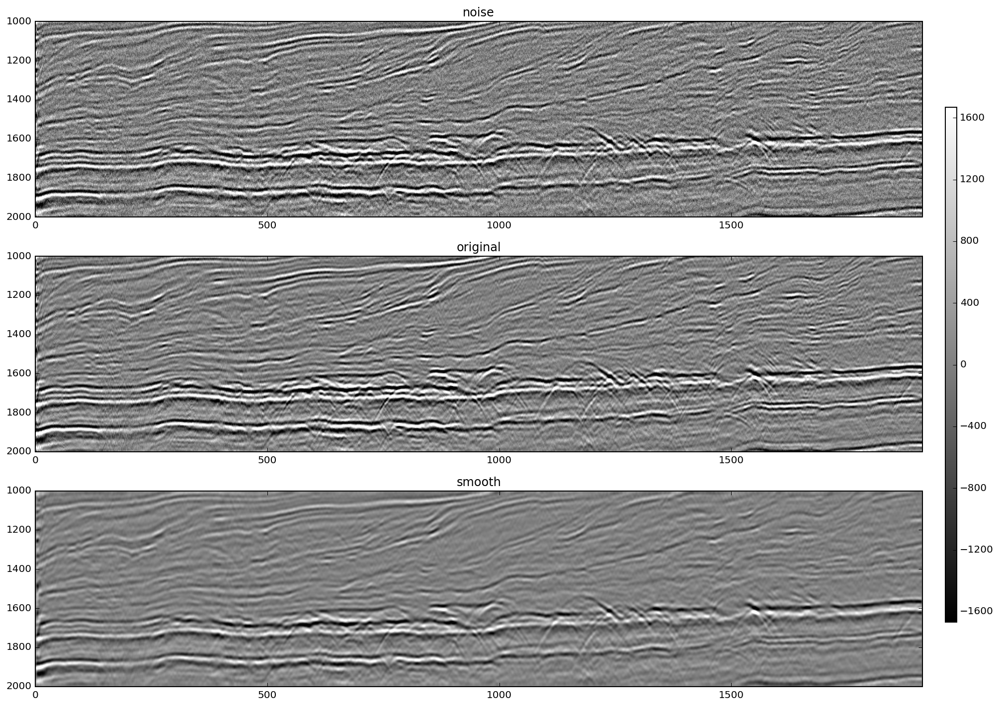

In [80]:
nt = header['ntraces']

f, ax = plt.subplots(nrows=3,ncols=1,figsize=(16,12),facecolor='w')
im0=ax[0].imshow(line_noise,interpolation='bilinear',aspect='auto',cmap='gray',extent=(0,nt,ll,uu),vmin=-clip,vmax=clip)
im1=ax[1].imshow(line_zoom, interpolation='bilinear',aspect='auto',cmap='gray',extent=(0,nt,ll,uu),vmin=-clip,vmax=clip)
im2=ax[2].imshow(line_filt, interpolation='bilinear',aspect='auto',cmap='gray',extent=(0,nt,ll,uu),vmin=-clip,vmax=clip)
ax[0].set_title('noise'), ax[1].set_title('original'), ax[2].set_title('smooth')
cax = f.add_axes([0.92, 0.2, 0.01, 0.6])
f.colorbar(im0, cax=cax, orientation='vertical')